# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/sample_dog_output.png?raw=1)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:
* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dogImages`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home directory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [0]:
!wget https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip
!wget https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip

In [0]:
!unzip dogImages.zip
!unzip lfw.zip

In [3]:
import numpy as np
from glob import glob

# load filenames for human and dog images
human_files = np.array(glob("lfw/*/*"))
dog_files = np.array(glob("dogImages/*/*/*"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8351 total dog images.


These next cells will examine how many images there are for each type of dog for the training, validation and test datsets

In [0]:
import os
counts = {}
for di in ['dogImages/train', 'dogImages/valid', 'dogImages/test']:
    count = {}
    ds = os.listdir(di)
    for d in ds:
        count[d] = len(glob(os.path.join(di, d, '*.jpg')))
    counts[di.split('/')[1]] = count

In [0]:
import matplotlib.pyplot as plt
%matplotlib inline

In [0]:
plt.rcParams['figure.figsize'] = (24, 12)

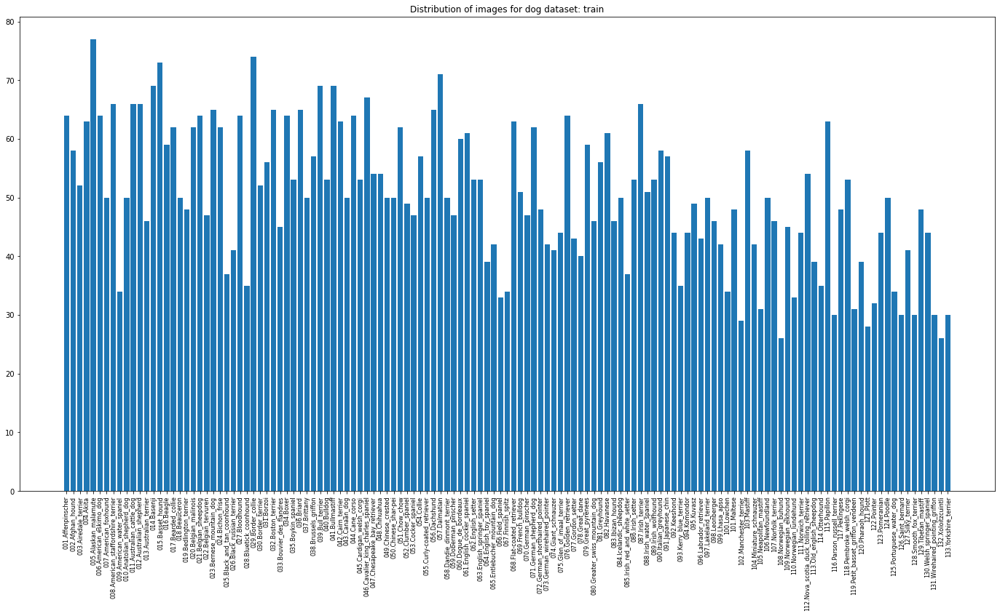

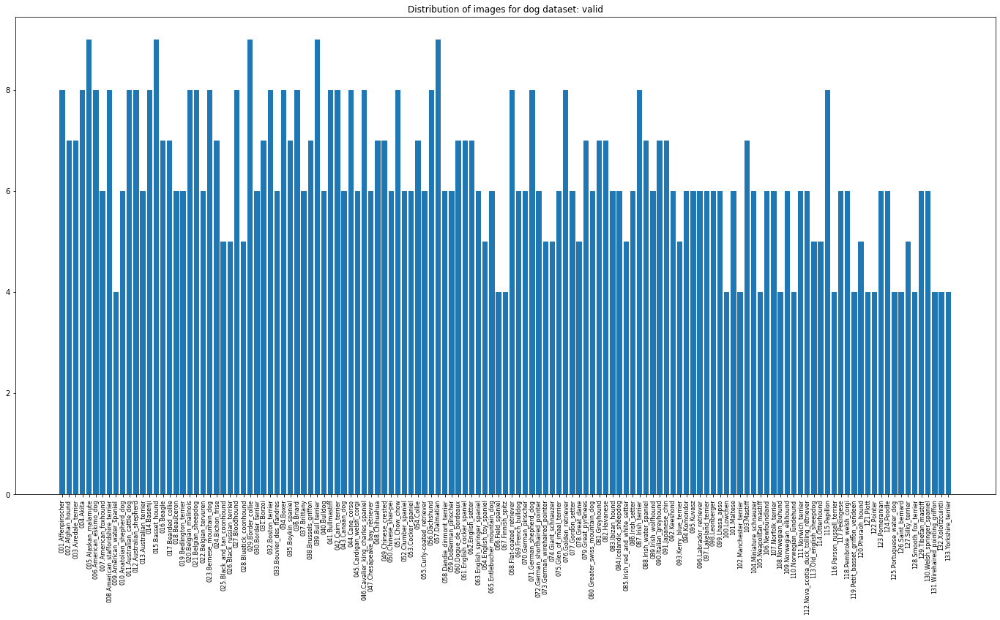

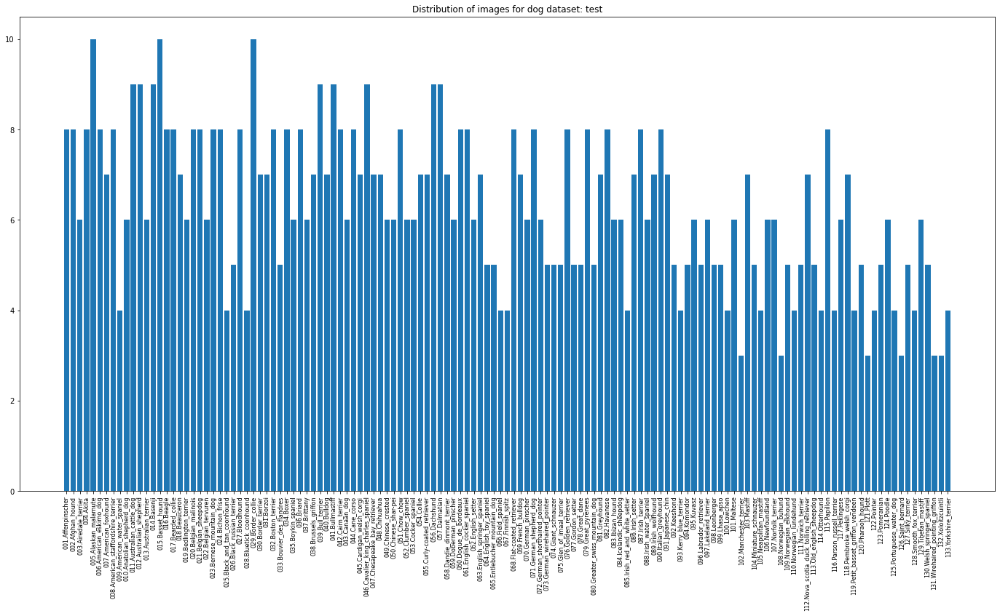

In [7]:
for c in counts:
    X = sorted(counts[c].items(), key=lambda x: x[0])
    x = [d[0] for d in X]
    l = [int(v.split('.')[0]) for v in x]
    y = [d[1] for d in X]
    plt.figure()
    plt.bar(l, y)
    plt.xticks(l, x, rotation='vertical', fontsize=8)
    plt.title('Distribution of images for dog dataset: ' + c)

We can most certainly see that there is an imbalance of the different classes.  There are some classes that have significantly more images than others.

<a id='step1'></a>
## Step 1: Detect Humans

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

In [8]:
!mkdir haarcascades
!wget -O haarcascades/haarcascade_frontalface_alt.xml https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_alt.xml

--2020-05-18 17:12:30--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_alt.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 676709 (661K) [text/plain]
Saving to: ‘haarcascades/haarcascade_frontalface_alt.xml’

haarcascades/haarca 100%[===================>] 660.85K  --.-KB/s    in 0.05s   

2020-05-18 17:12:31 (14.2 MB/s) - ‘haarcascades/haarcascade_frontalface_alt.xml’ saved [676709/676709]



Number of faces detected: 1


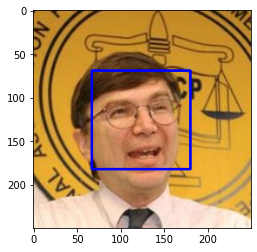

In [9]:
import cv2                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [0]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path, face_cascade):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 
(You can print out your results and/or write your percentages in this cell)

In [11]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

#-#-# Do NOT modify the code above this line. #-#-#

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
human_count = 0
dog_count = 0
for (h, d) in tqdm(zip(human_files_short, dog_files_short)):
    human_count += face_detector(h, face_cascade)
    dog_count += face_detector(d, face_cascade)

print('\nPercentage of human faces detected in human files: ' + str(human_count) + "%")
print('Percentage of human faces detected in dog files: ' + str(dog_count) + "%")

100it [00:41,  2.42it/s]


Percentage of human faces detected in human files: 99%
Percentage of human faces detected in dog files: 10%


We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [12]:
!wget -O haarcascades/haarcascade_frontalface_alt2.xml https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_alt2.xml

--2020-05-18 17:13:16--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_alt2.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 540616 (528K) [text/plain]
Saving to: ‘haarcascades/haarcascade_frontalface_alt2.xml’

haarcascades/haarca 100%[===================>] 527.95K  --.-KB/s    in 0.04s   

2020-05-18 17:13:17 (13.7 MB/s) - ‘haarcascades/haarcascade_frontalface_alt2.xml’ saved [540616/540616]



In [22]:
### (Optional) 
### TODO: Test performance of another face detection algorithm.
### Feel free to use as many code cells as needed.
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt2.xml')

human_count = 0
dog_count = 0
for (h, d) in tqdm(zip(human_files_short, dog_files_short)):
    human_count += face_detector(h, face_cascade)
    dog_count += face_detector(d, face_cascade)

print('\nPercentage of human faces detected in human files with alternative detector: ' + str(human_count) + "%")
print('Percentage of human faces detected in dog files with alternative detector: ' + str(dog_count) + "%")

100it [00:37,  2.66it/s]


Percentage of human faces detected in human files with alternative detector: 100%
Percentage of human faces detected in dog files with alternative detector: 17%


---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [14]:
import torch
import torchvision.models as models

# define VGG16 model
VGG16 = models.vgg16(pretrained=True)

# check if CUDA is available
use_cuda = torch.cuda.is_available()

# move model to GPU if CUDA is available
if use_cuda:
    print('CUDA is available!  Yay!!!!')
    VGG16 = VGG16.cuda()
else:
    print('CUDA is not available :(  Using CPU mode.')

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/checkpoints/vgg16-397923af.pth



CUDA is available!  Yay!!!!


Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

In [0]:
from PIL import Image
import torchvision.transforms as transforms
import torch

# Set PIL to be tolerant of image files that are truncated.
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

def VGG16_predict(img_path):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image

    # Step #1 - Read in the image
    img = Image.open(img_path)

    # Step #2 - Define transforms required to bring image
    # to an acceptable format for inference
    transform = transforms.Compose([
        transforms.Resize([256, 256]), # Resize to 256 x 256
        transforms.CenterCrop(224), # Centre crop: 224 x 224
        transforms.ToTensor(), # [0-1] normalize and change from HWC to CHW
        transforms.Normalize( # ImageNet standardisation
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225])
    ])    
    
    # Step #3 - Transform, add singleton dimension so that we are
    # technically using a batch size of 1 and send to GPU if applicable
    img = transform(img)
    if use_cuda:
        img = img.cuda()
    img = torch.unsqueeze(img, 0)

    # Step #4 - Inference
    output = VGG16(img)
    return int(torch.argmax(output, dim=1)) # predicted class index

### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [0]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    ## TODO: Complete the function.
    ind = VGG16_predict(img_path)
    return 151 <= ind <= 268 # true/false

### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 


In [17]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
human_count = 0
dog_count = 0
for (h, d) in tqdm(zip(human_files_short, dog_files_short)):
    human_count += dog_detector(h)
    dog_count += dog_detector(d)

print('\nPercentage of dogs detected in human files with VGG16: ' + str(human_count) + "%")
print('Percentage of dogs detected in dog files with VGG16: ' + str(dog_count) + "%")

100it [00:02, 34.32it/s]


Percentage of dogs detected in human files with VGG16: 1%
Percentage of dogs detected in dog files with VGG16: 99%


We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [18]:
### (Optional) 
### TODO: Report the performance of another pre-trained network.
### Feel free to use as many code cells as needed.
squeezenet = models.squeezenet1_0(pretrained=True)
if use_cuda:
    squeezenet = squeezenet.cuda()
def squeezenet_predict(img_path):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image

    # Step #1 - Read in the image
    img = Image.open(img_path)

    # Step #2 - Define transforms required to bring image
    # to an acceptable format for inference
    transform = transforms.Compose([
        transforms.Resize(256), # Resize so that the smaller dim is 256
        transforms.CenterCrop(224), # Centre crop: 224 x 224
        transforms.ToTensor(), # [0-1] normalize and change from HWC to CHW
        transforms.Normalize( # ImageNet standardisation
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225])
    ])    
    
    # Step #3 - Transform, add singleton dimension so that we are
    # technically using a batch size of 1 and send to GPU if applicable
    img = transform(img)
    if use_cuda:
        img = img.cuda()
    img = torch.unsqueeze(img, 0)

    # Step #4 - Inference
    output = squeezenet(img)
    return int(torch.argmax(output, dim=1)) # predicted class index

def dog_detector_squeezenet(img_path):
    ## TODO: Complete the function.
    ind = squeezenet_predict(img_path)
    return 151 <= ind <= 268 # true/false

human_count = 0
dog_count = 0
for (h, d) in tqdm(zip(human_files_short, dog_files_short)):
    human_count += dog_detector_squeezenet(h)
    dog_count += dog_detector_squeezenet(d)

print('\nPercentage of dogs detected in human files with SqueezeNet: ' + str(human_count) + "%")
print('Percentage of dogs detected in dog files with SqueezeNet: ' + str(dog_count) + "%")


Downloading: "https://download.pytorch.org/models/squeezenet1_0-a815701f.pth" to /root/.cache/torch/checkpoints/squeezenet1_0-a815701f.pth


0it [00:00, ?it/s]

100it [00:02, 33.79it/s]


Percentage of dogs detected in human files with SqueezeNet: 2%
Percentage of dogs detected in dog files with SqueezeNet: 99%


---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Brittany_02625.jpg?raw=1" width="100"> | <img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Welsh_springer_spaniel_08203.jpg?raw=1" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Curly-coated_retriever_03896.jpg?raw=1" width="200"> | <img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/American_water_spaniel_00648.jpg?raw=1" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | - | -
<img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Labrador_retriever_06457.jpg?raw=1" width="150"> | <img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Labrador_retriever_06455.jpg?raw=1" width="240"> | <img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Labrador_retriever_06449.jpg?raw=1" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [0]:
import os
from torchvision import datasets
from torch.utils.data import DataLoader

### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

## For posterity - this is how I originally did it before using ImageFolder
# class DogDataset(Dataset):
#     def __init__(self, img_dir, ext, transform=None):
#         self._filenames = list(glob(os.path.join(img_dir, '**', '*.' + ext)))
#         self._img_dir = img_dir
#         self._ext = ext
#         self._transform = transform
#         if transform is None:
#             self._transform = transforms.ToTensor()
#    
#     def __len__(self):
#         return len(self._filenames)
#    
#     def __getitem__(self, idx):
#         f = self._filenames[idx]
#         X = Image.open(f)
#         X = self._transform(X)
#         tokens = f.replace(self._img_dir, '').split('/')
#         y = tokens[1] if len(tokens[0]) == 0 else tokens[0]
#         y = y.split('.')[0]
#         y = int(y) - 1
#         return X, y


## Augmentation and transformation steps
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(256),
        transforms.RandomResizedCrop(224, scale=(0.96, 1.0), ratio=(0.95, 1.05)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225])
    ]),
    'valid_and_test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225])
    ])
}

## Generators
training_set = datasets.ImageFolder('dogImages/train', transform=data_transforms['train'])
validation_set = datasets.ImageFolder('dogImages/valid', transform=data_transforms['valid_and_test'])
test_set = datasets.ImageFolder('dogImages/test', transform=data_transforms['valid_and_test'])
loaders_scratch = {
    'train': DataLoader(training_set, batch_size=64, num_workers=4, shuffle=True),
    'valid': DataLoader(validation_set, batch_size=64, num_workers=4, shuffle=True),
    'test': DataLoader(test_set, batch_size=64, num_workers=4, shuffle=True)
}

In [24]:
training_set.class_to_idx

{'001.Affenpinscher': 0,
 '002.Afghan_hound': 1,
 '003.Airedale_terrier': 2,
 '004.Akita': 3,
 '005.Alaskan_malamute': 4,
 '006.American_eskimo_dog': 5,
 '007.American_foxhound': 6,
 '008.American_staffordshire_terrier': 7,
 '009.American_water_spaniel': 8,
 '010.Anatolian_shepherd_dog': 9,
 '011.Australian_cattle_dog': 10,
 '012.Australian_shepherd': 11,
 '013.Australian_terrier': 12,
 '014.Basenji': 13,
 '015.Basset_hound': 14,
 '016.Beagle': 15,
 '017.Bearded_collie': 16,
 '018.Beauceron': 17,
 '019.Bedlington_terrier': 18,
 '020.Belgian_malinois': 19,
 '021.Belgian_sheepdog': 20,
 '022.Belgian_tervuren': 21,
 '023.Bernese_mountain_dog': 22,
 '024.Bichon_frise': 23,
 '025.Black_and_tan_coonhound': 24,
 '026.Black_russian_terrier': 25,
 '027.Bloodhound': 26,
 '028.Bluetick_coonhound': 27,
 '029.Border_collie': 28,
 '030.Border_terrier': 29,
 '031.Borzoi': 30,
 '032.Boston_terrier': 31,
 '033.Bouvier_des_flandres': 32,
 '034.Boxer': 33,
 '035.Boykin_spaniel': 34,
 '036.Briard': 35,
 '

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?

**Answer**:
* I chose a size of 224 x 224 as this is the image resolution that is used for a variety of deep neural networks for image classification, such as AlexNet, VGG, ResNet, etc.  I simply resize the image so that it's 224 x 224 with bilinear interpolation then change the image so that it's a floating-point tensor, ensuring that the original format of the image in HWC format is now CHW.
* I applied a little bit of rotation as we don't expect dogs to have wildly different orientations other than portrait or landscape.  Usually the photos are taken by a human who want the photo to look sensible.  I also perform random horizontal flips, but not vertical as we don't expect the dogs to be upside down.  I also resize the image so that the smaller dimension is 256 so that we keep the same aspect ratio, then used random resized crops of size 224 x 224 where the scale of the crop is between 0.96 to 1.0 as I don't want to cut out a lot of the dog in the augmentation.  Doing this may make the breed more ambiguous to discern.  I also change the aspect ratio a bit to try and capture nonlinearities in the lens.  Finally, I normalise the image using the mean and standard deviation derived from ImageNet weights as a final post-processing step and also advised in the PyTorch docs.


### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [0]:
import torch.nn as nn
import torch.nn.functional as F

# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net, self).__init__()
        ## Define layers of a CNN

        # Define 3 Conv 2D layers with progressively larger
        # numbers of filters.  First two will have stride of 2
        # to prevent overfitting.  Last one has stride 1
        self.conv1 = nn.Conv2d(3, 32, 3, stride=2, padding=1)      
        self.conv2 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)

        # Max Pooling 2D after each Conv
        self.pool = nn.MaxPool2d(2, 2)
        
        # FC layers for non-linear mapping of features
        # to classifying dog
        self.fc1 = nn.Linear(7*7*128, 512)
        # One more for good measure
        self.fc2 = nn.Linear(512, 133) 
        
        # Define dropout
        self.dropout = nn.Dropout(0.25)
    
    def forward(self, x):
        ## Define forward behavior
        # 3 x 224 x 224

        # CONV-RELU-POOL 1
        x = F.relu(self.conv1(x)) # 32 x 112 x 112
        x = self.pool(x) # 32 x 56 x 56

        # CONV-RELU-POOL 2
        x = F.relu(self.conv2(x)) # 64 x 28 x 28
        x = self.pool(x) # 64 x 14 x 14

        # CONV-RELU-POOL 3
        x = F.relu(self.conv3(x)) # 128 x 14 x 14 - note stride=1
        x = self.pool(x) # 128 x 7 x 7
        
        # Flatten
        x = x.view(x.size(0), -1)
        
        # DROPOUT-FC-RELU
        x = self.dropout(x)
        x = F.relu(self.fc1(x))        

        # DROPOUT-FC
        x = self.dropout(x)
        x = self.fc2(x)

        # Return raw activations as we're using nn.CrossEntropyLoss
        return x

#-#-# You do NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()

# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

In [26]:
!pip install torchsummary

In [27]:
from torchsummary import summary
summary(model_scratch, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             896
         MaxPool2d-2           [-1, 32, 56, 56]               0
            Conv2d-3           [-1, 64, 28, 28]          18,496
         MaxPool2d-4           [-1, 64, 14, 14]               0
            Conv2d-5          [-1, 128, 14, 14]          73,856
         MaxPool2d-6            [-1, 128, 7, 7]               0
           Dropout-7                 [-1, 6272]               0
            Linear-8                  [-1, 512]       3,211,776
           Dropout-9                  [-1, 512]               0
           Linear-10                  [-1, 133]          68,229
Total params: 3,373,253
Trainable params: 3,373,253
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.57
Forward/backward pass size (MB): 4.60
Params size (MB): 12.87
Estima

In [28]:
model_scratch

Net(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=6272, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=133, bias=True)
  (dropout): Dropout(p=0.25, inplace=False)
)

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ I followed a guideline made by Andrej Karpathy in his blog post about different custom CNN architectures: https://cs231n.github.io/convolutional-networks/#architectures

There was one architecture that spoke to me: 

```
INPUT -> [CONV -> RELU -> POOL]*2 -> FC -> RELU -> FC
```
Note that `FC` means fully-connected / linear layers and `CONV` means 2D convolutional layers.  I liked this architecture in particular because not only is it somewhat deep (but not as deep as say ResNet) for quick testing, but there are multiple feature extraction layers so we can develop more complex features for the given input volume.  I also inserted dropout layers before every fully connected layer to minimise overfitting.  I added in an extra combination of `[CONV -> RELU -> POOL]` to really try and make a difference, so the final architecture is:

```
INPUT -> [CONV -> RELU -> POOL]*3 -> DROPOUT -> FC -> RELU -> DROPOUT -> FC
```

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [0]:
import torch.optim as optim

### TODO: select loss function
criterion_scratch = nn.CrossEntropyLoss()

### TODO: select optimizer
optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=0.01, momentum=0.9)
#optimizer_scratch = optim.Adam(model_scratch.parameters(), lr=0.1)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [0]:
# the following import is required for training to be robust to truncated images
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    n_every = 10
    for epoch in range(1, n_epochs+1):
        print("=== Epoch #{} ===".format(epoch))
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        correct_train = 0.0
        total_train = 0.0
        correct_valid = 0.0
        total_valid = 0.0        
        ###################
        # train the model #
        ###################
        model.train()
        print('=== Training ===')
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if batch_idx % n_every == 0:
                print('Batch #{} / {}...'.format(batch_idx + 1, len(loaders['train'])))
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## find the loss and update the model parameters accordingly
            # Step #1 - Zero the gradients
            optimizer.zero_grad()
            # Step #2 - Inference
            output = model(data)
            # Step #3 - Compute Loss
            loss = criterion(output, target)
            # Step #4 - Backpropagation
            loss.backward()
            # Step #5 - Update weights
            optimizer.step()

            ## record the average training loss, using something like
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            # convert output probabilities to predicted class
            pred = output.data.max(1, keepdim=True)[1]

            # For classification accuracy
            correct_train += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
            total_train += data.size(0)

        ######################    
        # validate the model #
        ######################
        model.eval()
        print('=== Validation ===')
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            if batch_idx % n_every == 0:
                print('Batch #{} / {}...'.format(batch_idx + 1, len(loaders['valid'])))

            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            # Step #1 - Do inference
            output = model(data)
            
            # Step #2 - Compute loss
            loss = criterion(output, target)

            ## record the average training loss, using something like
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.data - valid_loss))
            # convert output probabilities to predicted class
            pred = output.data.max(1, keepdim=True)[1]

            # For classification accuracy
            correct_valid += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
            total_valid += data.size(0)

        # print training/validation statistics 
        print('\nEpoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))
        
        print('Train Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct_train / total_train, correct_train, total_train))        

        print('\nValidation Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct_valid / total_valid, correct_valid, total_valid))        

        ## TODO: save the model if validation loss has decreased
        if valid_loss < valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min, valid_loss))            
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
        print()
    # return trained model
    return model

In [31]:
# train the model
model_scratch = train(100, loaders_scratch, model_scratch, optimizer_scratch, 
                      criterion_scratch, use_cuda, 'model_scratch.pt')

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

=== Epoch #1 ===
=== Training ===
Batch #1 / 105...
Batch #11 / 105...
Batch #21 / 105...
Batch #31 / 105...
Batch #41 / 105...
Batch #51 / 105...
Batch #61 / 105...
Batch #71 / 105...
Batch #81 / 105...
Batch #91 / 105...
Batch #101 / 105...
=== Validation ===
Batch #1 / 14...
Batch #11 / 14...

Epoch: 1 	Training Loss: 4.868650 	Validation Loss: 4.819810
Train Accuracy:  1% (82/6680)

Validation Accuracy:  1% (16/835)
Validation loss decreased (inf --> 4.819810).  Saving model ...

=== Epoch #2 ===
=== Training ===
Batch #1 / 105...
Batch #11 / 105...
Batch #21 / 105...
Batch #31 / 105...
Batch #41 / 105...
Batch #51 / 105...
Batch #61 / 105...
Batch #71 / 105...
Batch #81 / 105...
Batch #91 / 105...
Batch #101 / 105...
=== Validation ===
Batch #1 / 14...
Batch #11 / 14...

Epoch: 2 	Training Loss: 4.714722 	Validation Loss: 4.661388
Train Accuracy:  2% (160/6680)

Validation Accuracy:  2% (22/835)
Validation loss decreased (4.819810 --> 4.661388).  Saving model ...

=== Epoch #3 ===

<All keys matched successfully>

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [32]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

# call test function    
test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 3.959711


Test Accuracy: 11% (92/836)


---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [0]:
## TODO: Specify data loaders
loaders_transfer = loaders_scratch

### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [34]:
import torchvision.models as models
import torch.nn as nn

## TODO: Specify model architecture
model_transfer = models.resnet50(pretrained=True)

# We should only fine-tune the last layer
# The conv layers for feature extraction are just fine
for param in model_transfer.parameters():
    param.requires_grad = False

# Replace the last fully connected layer with the total
# number of classes of dogs
num_ftrs = model_transfer.fc.in_features
model_transfer.fc = nn.Linear(num_ftrs, 133)

if use_cuda:
    model_transfer = model_transfer.cuda()

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__  I simply used the ResNet50 architecture but removed the last fully-connected layer replacing it from 1000 output neurons to 133 neurons as we have 133 classes.  I've also frozen the feature extraction layers and only tuned the weights of the fully-connected layer as this layer is responsible for the classification of the dogs.  Because ResNet50 was trained on the ImageNet database, it has seen a wide variety of scenarios, objects and lighting conditions so it would make sense to not tune these parameters.

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

In [0]:
criterion_transfer = nn.CrossEntropyLoss()
optimizer_transfer = optim.SGD(model_transfer.parameters(), lr=0.01, momentum=0.9)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

In [36]:
# train the model
n_epochs = 100
model_transfer = train(n_epochs, loaders_transfer, model_transfer, optimizer_transfer, criterion_transfer, use_cuda, 'model_transfer.pt')

# load the model that got the best validation accuracy (uncomment the line below)
model_transfer.load_state_dict(torch.load('model_transfer.pt'))

=== Epoch #1 ===
=== Training ===
Batch #1 / 105...
Batch #11 / 105...
Batch #21 / 105...
Batch #31 / 105...
Batch #41 / 105...
Batch #51 / 105...
Batch #61 / 105...
Batch #71 / 105...
Batch #81 / 105...
Batch #91 / 105...
Batch #101 / 105...
=== Validation ===
Batch #1 / 14...
Batch #11 / 14...

Epoch: 1 	Training Loss: 2.737775 	Validation Loss: 1.198627
Train Accuracy: 46% (3111/6680)

Validation Accuracy: 75% (629/835)
Validation loss decreased (inf --> 1.198627).  Saving model ...

=== Epoch #2 ===
=== Training ===
Batch #1 / 105...
Batch #11 / 105...
Batch #21 / 105...
Batch #31 / 105...
Batch #41 / 105...
Batch #51 / 105...
Batch #61 / 105...
Batch #71 / 105...
Batch #81 / 105...
Batch #91 / 105...
Batch #101 / 105...
=== Validation ===
Batch #1 / 14...
Batch #11 / 14...

Epoch: 2 	Training Loss: 0.959676 	Validation Loss: 0.736799
Train Accuracy: 79% (5324/6680)

Validation Accuracy: 80% (676/835)
Validation loss decreased (1.198627 --> 0.736799).  Saving model ...

=== Epoch #

<All keys matched successfully>

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

In [37]:
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 0.552524


Test Accuracy: 87% (734/836)


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [0]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.

# list of class names by index, i.e. a name can be accessed like class_names[0]
class_names = [item[4:].replace("_", " ") for item in training_set.classes]

def predict_breed_transfer(img_path):
    # load the image and return the predicted breed
    img = Image.open(img_path)
    img = data_transforms['valid_and_test'](img)
    if use_cuda:
        img = img.cuda()
    output = model_transfer(torch.unsqueeze(img, 0))
    ind = torch.argmax(output, dim=1)
    return class_names[ind]

## Test cell for `predict_breed_transfer`

File:dogImages/valid/034.Boxer/Boxer_02429.jpg


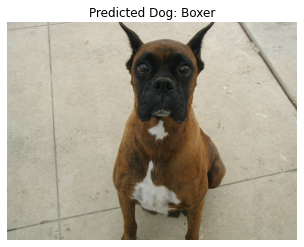

In [39]:
print('File:' + dog_files_short[0])
pred = predict_breed_transfer(dog_files_short[0])
img = Image.open(dog_files_short[0])
img = np.array(img)
plt.imshow(img)
plt.axis('off')
_ = plt.title('Predicted Dog: ' + pred)

---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `dog_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/sample_human_output.png?raw=1)


### (IMPLEMENTATION) Write your Algorithm

In [0]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')
def run_app(img_path):
    # Open image
    img = np.array(Image.open(img_path))

    # Display it
    plt.figure()
    plt.imshow(img)
    plt.axis('off')

    # Change the title to be one of the three cases - human, dog or neither
    if face_detector(img_path, face_cascade):
        plt.title('Hello, human! You look like a ' + predict_breed_transfer(img_path))
    elif dog_detector_squeezenet(img_path):
        plt.title('Hello, dog! You look like a ' + predict_breed_transfer(img_path))
    else:
        plt.title('Oh no!  You''re not a human or a dog!')

---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__
1. There are some portions of code in this notebook that are repeated and don't follow the DRY principle.  Some refactoring may be of benefit here.
2.  Perhaps more image augmentations, such as changing the lighting, making more severe affine transformations and more aggressive resizing may improve model accuracy
3.  Report the top-N accuracy and classes rather than just top-1.

In [0]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

## suggested code, below
random_subset = 10
human_ind = np.random.permutation(100)[:random_subset]
dog_ind = np.random.permutation(100)[:random_subset]

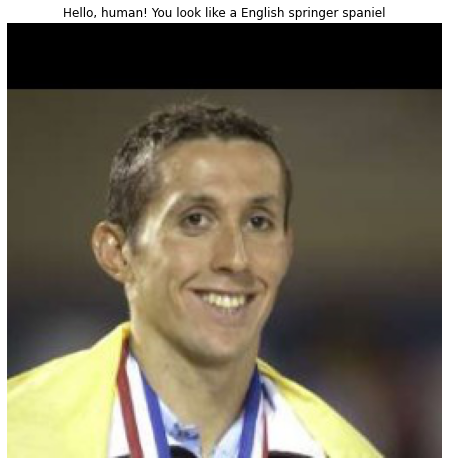

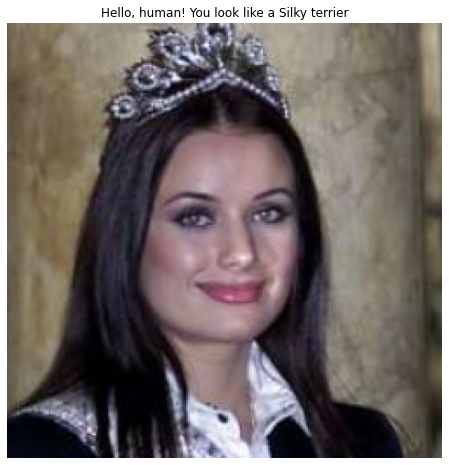

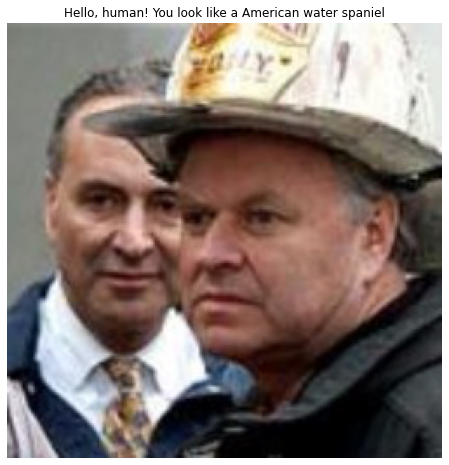

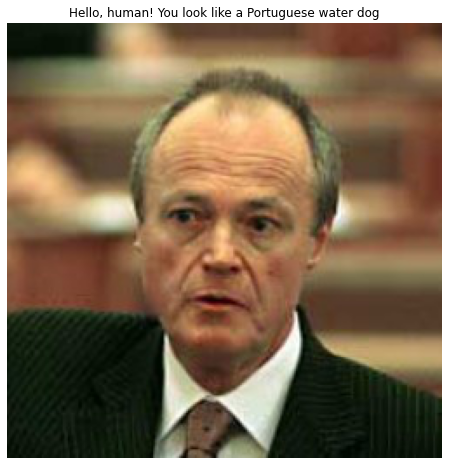

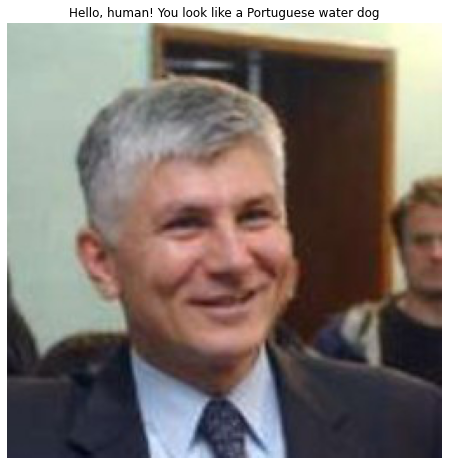

...

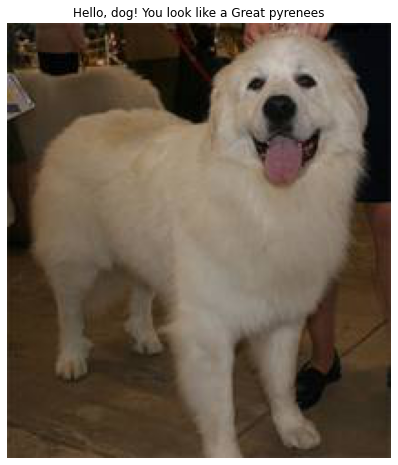

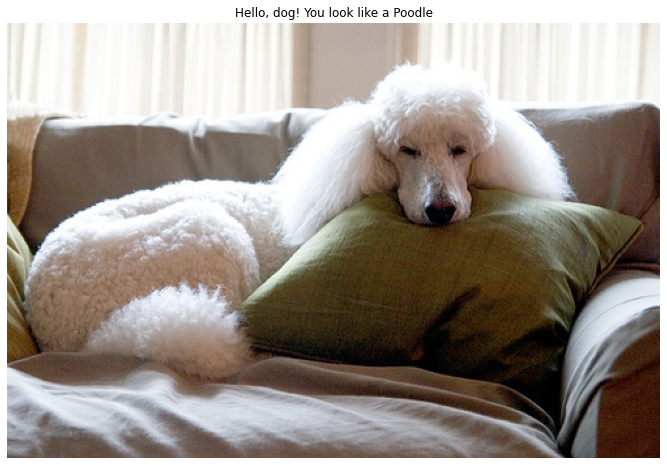

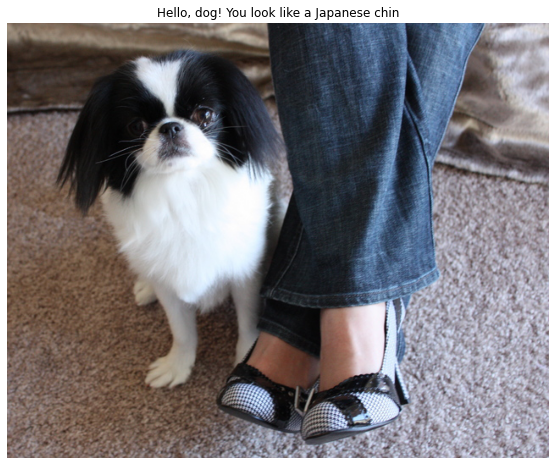

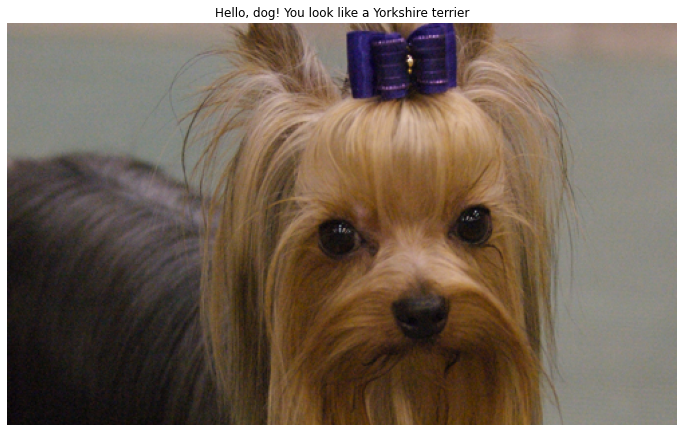

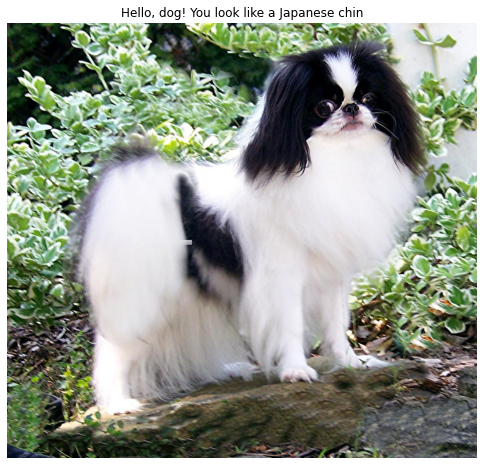

In [60]:
plt.rcParams['figure.figsize'] = (12, 8)
for file in np.hstack((human_files[human_ind], dog_files[dog_ind])):
    run_app(file)

## Function that obtains the ground truth and predicted labels for the test set

In [0]:
def test_run_get_labels(loaders, model, use_cuda):
    model.eval()
    y_pred = []
    y_true = []
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        y_pred.append(pred.cpu().numpy().flatten())
        y_true.append(target.data.view_as(pred).cpu().numpy().flatten())
    y_pred = np.hstack(y_pred)
    y_true = np.hstack(y_true)

    return y_pred, y_true

y_pred, y_true = test_run_get_labels(loaders_transfer, model_transfer, use_cuda)

## Plot Confusion Matrix

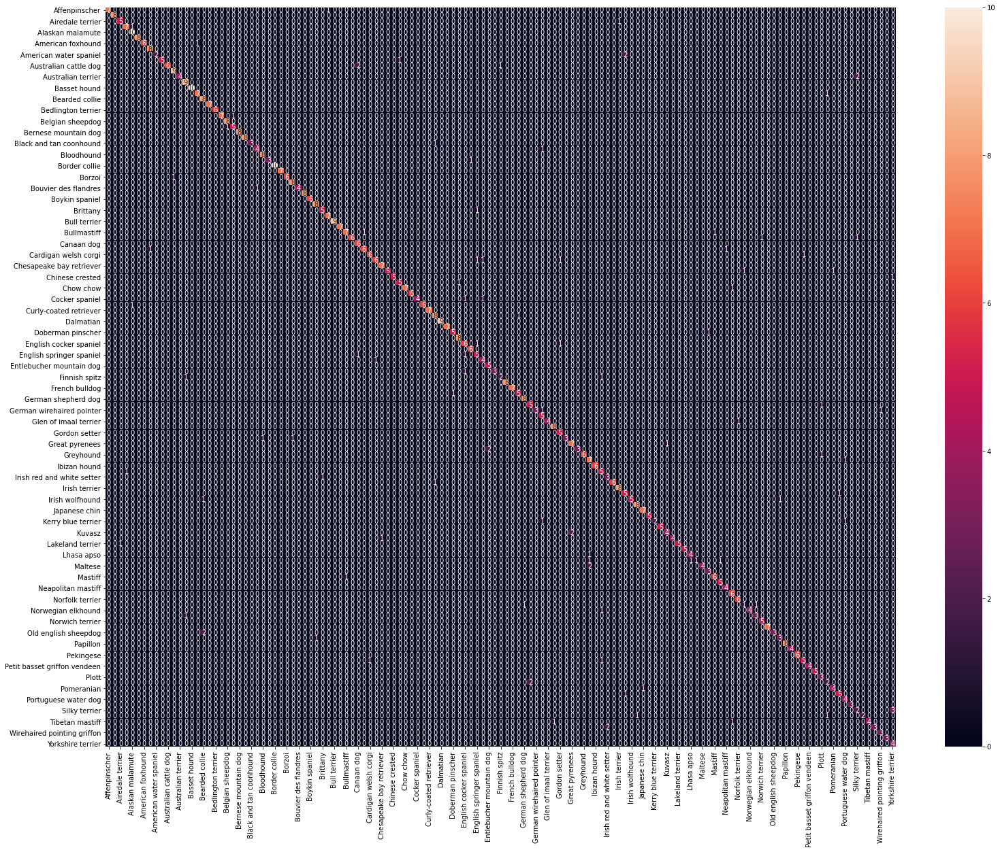

In [44]:
import seaborn as sn
from sklearn.metrics import confusion_matrix
import pandas as pd

conf_mat = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(conf_mat, index=class_names,
                  columns=class_names)
plt.figure(figsize=(26,20))
sn.heatmap(df_cm, annot=True)

## Calculate precision and recall for multi-class

Text(0.5, 1.0, 'Precision for the dog dataset - test')

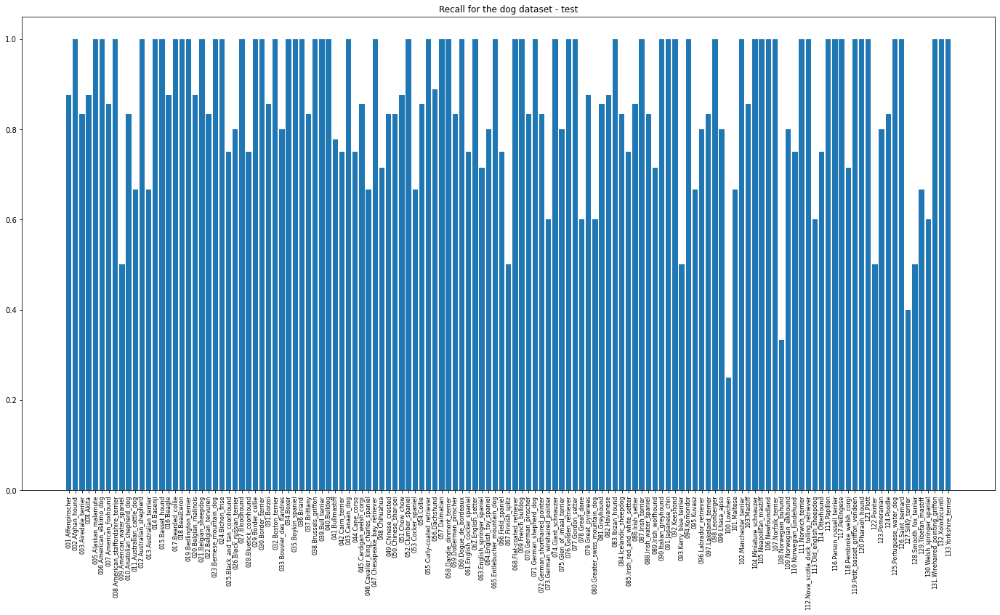

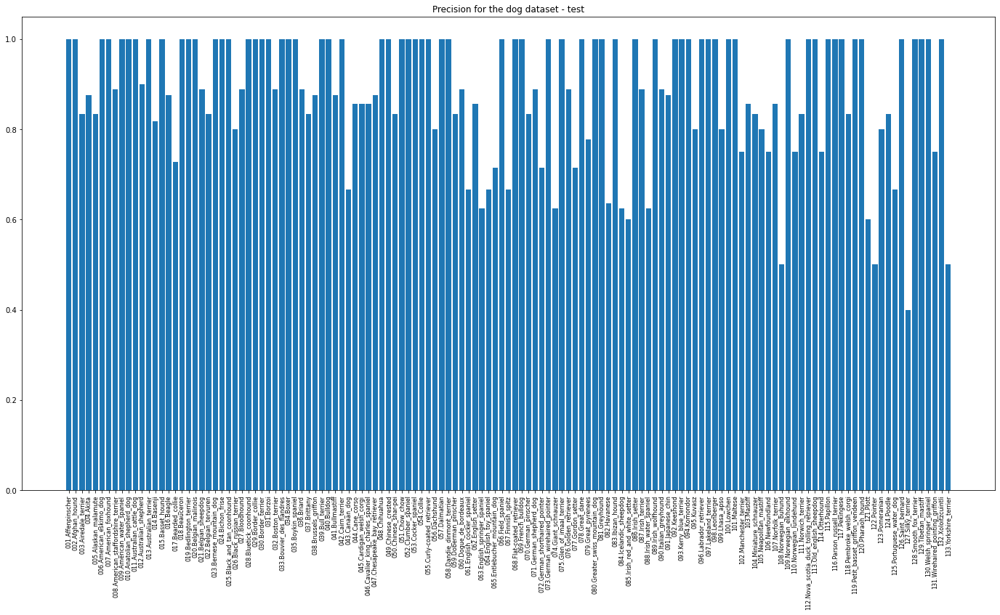

In [49]:
plt.rcParams['figure.figsize'] = (24, 12)

recall = np.diag(conf_mat) / np.sum(conf_mat, axis = 1)
precision = np.diag(conf_mat) / np.sum(conf_mat, axis = 0)

# Take the labels from before
lbls = sorted(counts['test'])

# Plot bar graphs for precision and recall
x = list(range(133))
plt.figure()
plt.bar(x, recall)
plt.xticks(x, lbls, rotation='vertical', fontsize=8)
plt.title('Recall for the dog dataset - test')

plt.figure()
plt.bar(x, precision)
plt.xticks(x, lbls, rotation='vertical', fontsize=8)
plt.title('Precision for the dog dataset - test')

In [50]:
print('Mean precision: ' + str(np.mean(precision)))
print('Mean recall: ' + str(np.mean(recall)))

Mean precision: 0.8867233017608958
Mean recall: 0.8630236305048335


In [51]:
ind = np.argmin(precision)
print('Class with the lowest precision: {} - {}'.format(lbls[ind], precision[ind]))
ind = np.argmin(recall)
print('Class with the lowest recall: {} - {}'.format(lbls[ind], recall[ind]))

Class with the lowest precision: 127.Silky_terrier - 0.4
Class with the lowest recall: 100.Lowchen - 0.25


In [52]:
print('Accuracy: {}'.format(np.mean(y_true == y_pred)))

Accuracy: 0.8779904306220095


Let's have a look at the images with the lowest precision and lowest recall

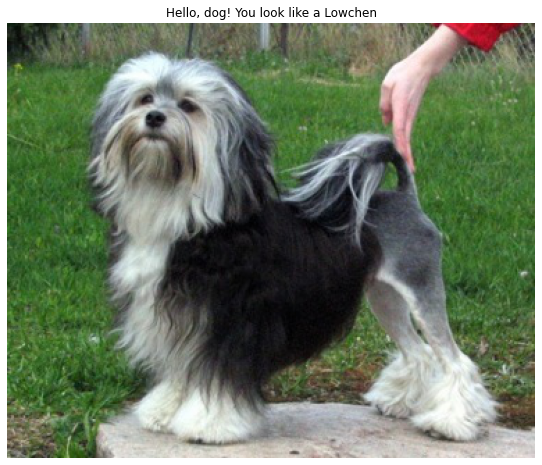

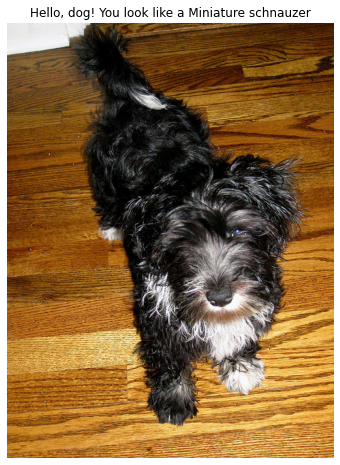

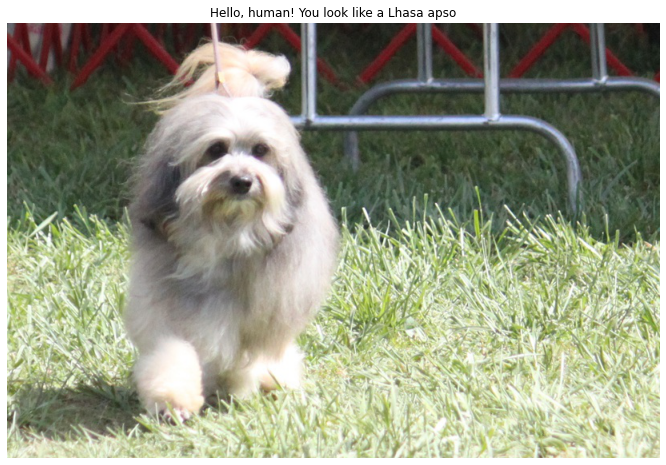

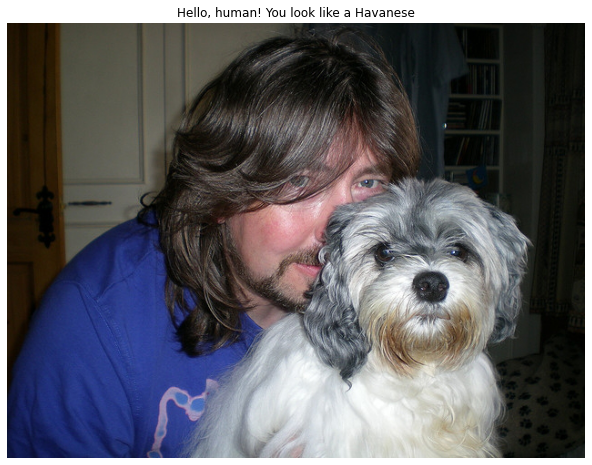

In [61]:
lowchen = glob('dogImages/test/100.Lowchen/*.jpg')
for d in lowchen:
    run_app(d)

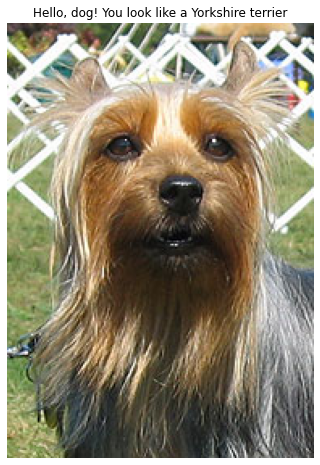

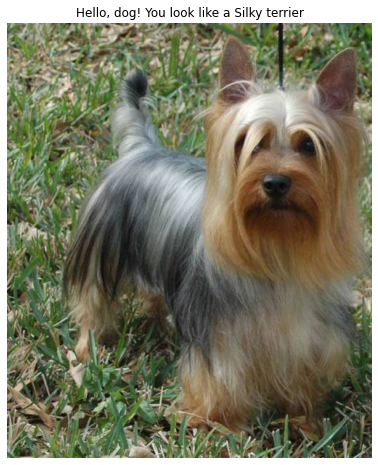

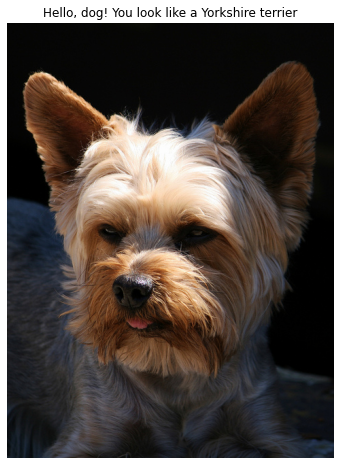

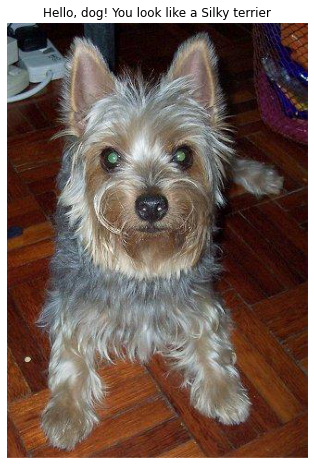

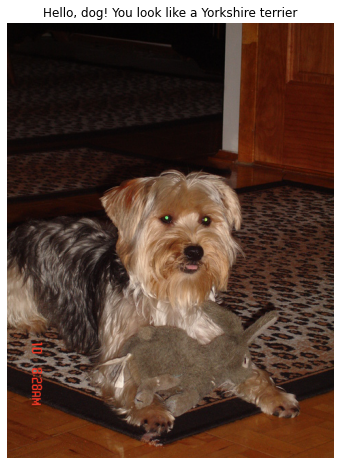

In [62]:
silky = glob('dogImages/test/127.Silky_terrier/*.jpg')
for d in silky:
    run_app(d)